In [1]:
import pandas as pd
from pandas import Series
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
mutations = pd.read_csv('summary.hg19_multianno.csv') #import data
mutations.head()
mutations.shape

(3237, 40)

In [2]:
total_common = mutations[mutations['Sample'].str.contains(':')] #pull out identical mutations
total_common.shape

(30, 40)

In [3]:
total_common_mutant = total_common[['Sample','Gene.refGene','Func.refGene','ExonicFunc.refGene']]
total_common_mutant['Gene.refGene'] = total_common_mutant['Gene.refGene']+ ' '+total_common_mutant['Func.refGene'] +' '+total_common_mutant['ExonicFunc.refGene']

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [4]:
total_common_mutant_split = pd.concat([Series(row['Gene.refGene'],row['Sample'].split(':')) for i,row in total_common_mutant.iterrows()]).reset_index()
total_common_mutant_split.columns = ['Sample','0']
total_common_mutant_split['Gene.refGene'],total_common_mutant_split['Func.refGene'],total_common_mutant_split['ExonicFunc.refGene'] = zip(*total_common_mutant_split['0'].str.split(' ').tolist())
del total_common_mutant_split["0"]  
mutations_split = mutations[mutations['Sample'].map(len)<10]
mutations_split = mutations_split[['Sample','Gene.refGene','Func.refGene','ExonicFunc.refGene']]
mutations_split = mutations_split.append(total_common_mutant_split)
mutations_split.shape

(3272, 4)

In [5]:
total_exonic = mutations_split[mutations_split['Func.refGene'] == 'exonic']
total_exonic.head()

,Sample,Gene.refGene,Func.refGene,ExonicFunc.refGene
1,RB869TD2,TNFRSF4,exonic,nonsynonymous SNV
3,RB871TD2,C1orf86,exonic,nonsynonymous SNV
5,RB866TD1,MMEL1,exonic,nonsynonymous SNV
7,RB871TD1,CEP104,exonic,nonsynonymous SNV
8,RB871TD1,DFFB,exonic,nonsynonymous SNV


In [6]:
all_gene_count = total_exonic['Gene.refGene'].value_counts()
all_gene = all_gene_count.index.tolist() #creat a list of all mutated genes

In [7]:
gene_frequency = pd.DataFrame(all_gene_count)
gene_frequency[gene_frequency['Gene.refGene']>=2].shape
cols = all_gene[:183] #list of genes with mutation_frequence>2 in all sample

In [8]:
exonic = total_exonic[total_exonic['Gene.refGene'].isin(cols)]
exonic['value'] = 1
exonic_pivot = exonic.pivot_table(index = 'Gene.refGene',columns = 'Sample',values = 'value',aggfunc=np.sum)
exonic_pivot['gene_mu_freq'] = exonic_pivot.fillna(0).sum(axis = 1) #total number of mutations occured in the gene
exonic_pivot['mutation_freq'] = 24 - exonic_pivot.isnull().sum(axis=1) #total number of samples contain mutation in the gene
exonic_pivot = exonic_pivot.sort_values('mutation_freq',ascending = False)
exonic_pivot['gene'] = exonic_pivot.index.tolist()
exonic_pivot.head()

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


Sample,RB862TD1,RB862TD2,RB863TD1,RB863TD2,RB864TD1,RB864TD2,RB865TD1,RB865TD2,RB866TD1,RB866TD2,...,RB870TD2,RB871TD1,RB871TD2,RB872TD1,RB872TD2,RB873TD1,RB873TD2,gene_mu_freq,mutation_freq,gene
Gene.refGene,,,,,,,,,,,,,,,,,,,,,
TTN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,1.0,...,1.0,3.0,NaN,NaN,1.0,1.0,NaN,13.0,9,TTN
TP53,1.0,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,8.0,8,TP53
FAT3,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,NaN,1.0,NaN,NaN,NaN,1.0,NaN,5.0,5,FAT3
DSPP,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,4.0,4,DSPP
USH2A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,4.0,4,USH2A


In [9]:
freq_order = exonic_pivot.index.tolist() 

[<matplotlib.text.Text at 0x1176675c0>, <matplotlib.text.Text at 0x1172407f0>]

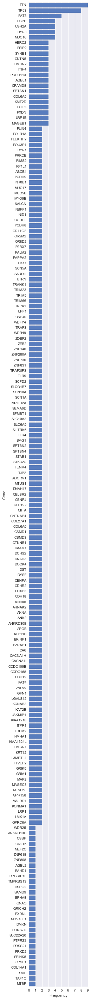

In [10]:
f, ax = plt.subplots(figsize=(3, 50))
sns.set_color_codes("muted")
sns.barplot(x="mutation_freq", y="gene", data=exonic_pivot,
             color="b",lw=.1)
ax.set( ylabel="Gene",
       xlabel="Frequency")

In [11]:
def clean(df):
    counts = pd.DataFrame()
    for item in all_gene:
        data = df[df['Gene.refGene'] == item]
        count = pd.DataFrame(data['Sample'].value_counts())
        count.columns = [item]
        counts = pd.concat([counts,count],axis = 1)
        counts = counts.fillna(0)
    return counts
cleaned_exonic = clean(exonic)

In [12]:
high_freq_exonic = cleaned_exonic[cols]
high_freq_exonic_t = high_freq_exonic.T
high_freq_exonic_t = high_freq_exonic_t.reindex(freq_order) #order according to total number of samples contain mutation in the gene
high_freq_exonic_t.head()

,RB862TD1,RB862TD2,RB863TD1,RB863TD2,RB864TD1,RB864TD2,RB865TD1,RB865TD2,RB866TD1,RB866TD2,...,RB869TD1,RB869TD2,RB870TD1,RB870TD2,RB871TD1,RB871TD2,RB872TD1,RB872TD2,RB873TD1,RB873TD2
TTN,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,1.0,...,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,0.0
TP53,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
FAT3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
DSPP,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
USH2A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [13]:
f, ax = plt.subplots(figsize=(100, 400))
sns.set(font_scale=10)
sns.heatmap(high_freq_exonic_t,linewidth = .5)
ax.tick_params(axis='both', which='major', labelsize=100)
plt.xticks(rotation=70)
plt.yticks(rotation = 0)
plt.show()

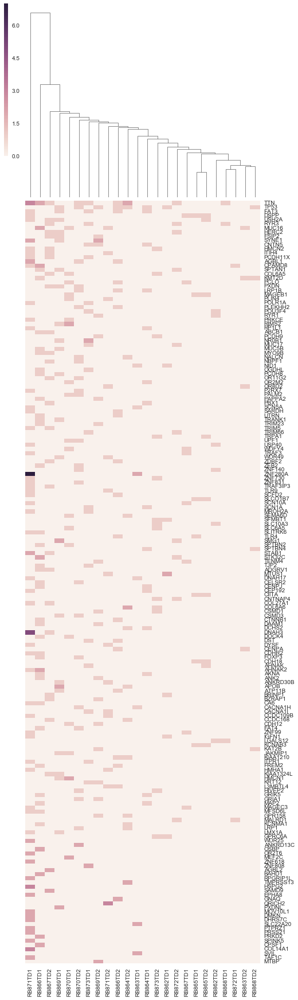

In [14]:
sns.set(font_scale=1)
cg = sns.clustermap(high_freq_exonic_t,figsize=(8, 30),row_cluster=False)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

In [15]:
mutations_split['ExonicFunc.refGene'].value_counts()
sample_list = mutations_split['Sample'].value_counts().index.tolist()
def count(df):
    counts = pd.DataFrame()
    for item in sample_list:
        data = df[df['Sample'] == item]
        count = pd.DataFrame(data['ExonicFunc.refGene'].value_counts())
        count.columns = [item]
        counts = pd.concat([counts,count],axis = 1)
        counts = counts.fillna(0)
    return counts
mutation_type_count = count(mutations_split)
mutation_type_count = mutation_type_count.T
mutation_type_count['sum'] = mutation_type_count.sum(axis = 1)
mutation_type_count.head(3)

,.,nonsynonymous,nonsynonymous SNV,stopgain,stoploss,synonymous,synonymous SNV,unknown,sum
RB871TD1,336.0,1.0,154.0,2.0,0.0,4.0,169.0,3.0,669.0
RB866TD1,197.0,0.0,207.0,2.0,3.0,0.0,74.0,5.0,488.0
RB867TD2,154.0,0.0,103.0,9.0,0.0,0.0,40.0,2.0,308.0


In [16]:
mutation_type_count['nonsyn%'] = (mutation_type_count['nonsynonymous SNV']+mutation_type_count['nonsynonymous']+mutation_type_count['stopgain']+mutation_type_count['stoploss'])/mutation_type_count['sum']
mutation_type_count['syn%'] = mutation_type_count['nonsyn%'] + (mutation_type_count['synonymous']+mutation_type_count['synonymous SNV'])/mutation_type_count['sum']
mutation_type_count['Sample'] = mutation_type_count.index
mutation_type_count.sort_values('Sample', inplace = True)
mutation_type_count_columns = mutation_type_count.columns.tolist()
mutation_type_count_columns[0] = 'intronic' #change the '.' column into 'intronic' column
mutation_type_count.columns = mutation_type_count_columns
mutation_type_count.head()

,intronic,nonsynonymous,nonsynonymous SNV,stopgain,stoploss,synonymous,synonymous SNV,unknown,sum,nonsyn%,syn%,Sample
RB862TD1,19.0,0.0,15.0,1.0,0.0,0.0,10.0,0.0,45.0,0.355556,0.577778,RB862TD1
RB862TD2,8.0,0.0,11.0,2.0,0.0,0.0,5.0,0.0,26.0,0.500000,0.692308,RB862TD2
RB863TD1,18.0,1.0,23.0,1.0,0.0,0.0,4.0,0.0,47.0,0.531915,0.617021,RB863TD1
RB863TD2,2.0,0.0,17.0,0.0,0.0,0.0,5.0,0.0,24.0,0.708333,0.916667,RB863TD2
RB864TD1,47.0,0.0,52.0,6.0,0.0,0.0,22.0,1.0,128.0,0.453125,0.625000,RB864TD1


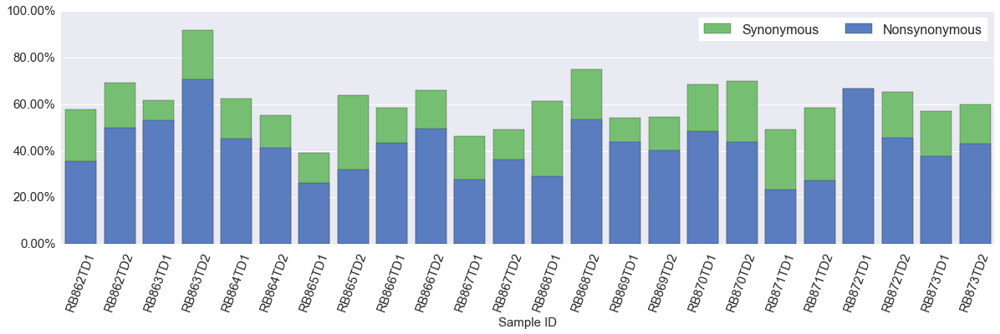

In [17]:
f_all, ax_all = plt.subplots(figsize=(20, 5))
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})

sns.set_color_codes("muted")
sns.barplot(x="Sample", y="syn%", data=mutation_type_count,
            label="Synonymous", color="g")
sns.set_color_codes("muted")
sns.barplot(x="Sample", y="nonsyn%", data=mutation_type_count,
            label="Nonsynonymous", color="b")

ax_all.legend(ncol=5, loc="upper right", frameon=True,prop={'size':16})
ax_all.set(xlabel="Sample ID",
       ylabel="")
ax_all.set_xlabel(xlabel = 'Sample ID',fontsize=15)
ax_all.tick_params(axis='both', which='major', labelsize=15)
vals = ax_all.get_yticks()
ax_all.set_yticklabels(['{:3.2f}%'.format(x*100) for x in vals])
plt.xticks(rotation=70)
plt.show()

In [18]:
total_exonic['ExonicFunc.refGene'].value_counts()
def count(df):
    counts = pd.DataFrame()
    for item in sample_list:
        data = df[df['Sample'] == item]
        count = pd.DataFrame(data['ExonicFunc.refGene'].value_counts())
        count.columns = [item]
        counts = pd.concat([counts,count],axis = 1)
        counts = counts.fillna(0)
    return counts
syn_count = count(total_exonic)
syn_count = syn_count.T
syn_count['nonsyn'] = syn_count['nonsynonymous SNV']+syn_count['stopgain']+syn_count['stoploss']
syn_count['total'] = syn_count['nonsyn']+syn_count['synonymous SNV']

In [19]:
syn_count['Sample'] = syn_count.index
syn_count.sort_values('Sample', inplace = True)
syn_count.head(3)

,nonsynonymous,nonsynonymous SNV,stopgain,stoploss,synonymous,synonymous SNV,unknown,nonsyn,total,Sample
RB862TD1,0.0,15.0,1.0,0.0,0.0,10.0,0.0,16.0,26.0,RB862TD1
RB862TD2,0.0,11.0,2.0,0.0,0.0,5.0,0.0,13.0,18.0,RB862TD2
RB863TD1,1.0,23.0,1.0,0.0,0.0,4.0,0.0,24.0,28.0,RB863TD1


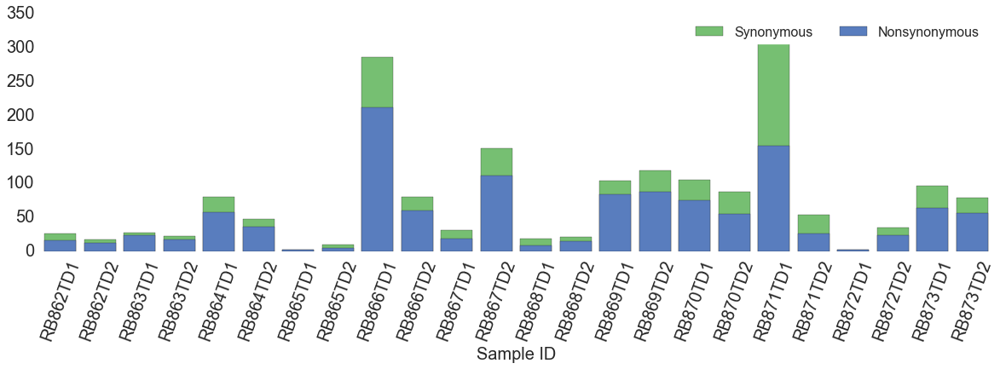

In [20]:
f, ax = plt.subplots(figsize=(20, 5))
sns.set_color_codes("muted")

sns.barplot(x="Sample", y="total", data=syn_count,
            label="Synonymous", color="g")
sns.set_color_codes("muted")

sns.barplot(x="Sample", y="nonsyn", data=syn_count,
            label="Nonsynonymous", color="b")

ax.legend(ncol=5, loc="upper right", frameon=True,prop={'size':16})
ax.set(xlabel="Sample ID",
       ylabel="")
ax.set_xlabel(xlabel = 'Sample ID',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=20)
plt.xticks(rotation=70)

sns.despine(left=True, bottom=True)
plt.show()

In [21]:
synon = total_exonic[total_exonic['Gene.refGene'].isin(cols)]
synon = synon[synon['ExonicFunc.refGene']!= 'synonymous SNV']
synon = synon[synon['ExonicFunc.refGene']!= 'synonymous']
synon_data = synon[['Sample','Gene.refGene','ExonicFunc.refGene']]
synon_data.head()

,Sample,Gene.refGene,ExonicFunc.refGene
13,RB871TD1,CA6,nonsynonymous SNV
14,RB866TD1,CA6,nonsynonymous SNV
40,RB871TD1,HSPG2,nonsynonymous SNV
43,RB871TD1,EPHA8,nonsynonymous SNV
126,RB866TD1,CELSR2,nonsynonymous SNV


In [22]:
synon_data['ExonicFunc.refGene'].replace('nonsynonymous SNV','1',inplace = True)
synon_data['ExonicFunc.refGene'].replace('nonsynonymous','1',inplace = True)
synon_data['ExonicFunc.refGene'].replace('stopgain','100',inplace = True)
synon_data['ExonicFunc.refGene'].replace('stoploss','100',inplace = True)
synon_data['ExonicFunc.refGene'].replace('unknown','0',inplace = True)
synon_data['ExonicFunc.refGene'] = synon_data['ExonicFunc.refGene'].astype('int')
synon_data.shape

//anaconda/lib/python3.5/site-packages/pandas/core/generic.py:3430: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


(309, 3)

In [23]:
import numpy as np
synon_pivot = synon_data.pivot_table(index = 'Gene.refGene',columns = 'Sample',values = 'ExonicFunc.refGene',aggfunc=np.sum)
synon_pivot['sum_score'] = synon_pivot.fillna(0).sum(axis = 1)
synon_pivot.shape

(167, 25)

In [24]:
synon_gene_list = synon_pivot[synon_pivot['sum_score'] >0].sort_values( 'sum_score', ascending = False).index.tolist() #remove 'unknown' mutations
synon_pivot = synon_pivot.fillna('0')
synon_pivot_t_highfreq = synon_pivot.T[synon_gene_list]
synon_pivot_t_highfreq = synon_pivot_t_highfreq.T
synon_pivot_t_highfreq
s_c = synon_pivot_t_highfreq.columns
synon_pivot_t_highfreq[s_c] = synon_pivot_t_highfreq[s_c].astype('float')
synon_pivot_t_highfreq[s_c].shape

(165, 25)

In [25]:
def changes(x):
    if x >=1000:
        return 3
    elif 100<=x<1000:
        return 2
    elif 0<x<=10:
        return 1
    else:
        return x
synon_pivot_t_highfreq = synon_pivot_t_highfreq.applymap(changes)

In [26]:
synon_pivot_t_highfreq = synon_pivot_t_highfreq.reindex(synon_gene_list)
del synon_pivot_t_highfreq['sum_score']
synon_pivot_t_highfreq.head()

Sample,RB862TD1,RB862TD2,RB863TD1,RB863TD2,RB864TD1,RB864TD2,RB865TD1,RB865TD2,RB866TD1,RB866TD2,...,RB869TD1,RB869TD2,RB870TD1,RB870TD2,RB871TD1,RB871TD2,RB872TD1,RB872TD2,RB873TD1,RB873TD2
Gene.refGene,,,,,,,,,,,,,,,,,,,,,
TP53,1.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,1.0,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
TTN,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
MUC17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0
L3MBTL4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
GNAQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
f, ax = plt.subplots(figsize=(100, 400))
sns.heatmap(synon_pivot_t_highfreq,cbar=False,cmap="Blues",linewidths=.5)
ax.tick_params(axis='both', which='major', labelsize=100)
plt.xticks(rotation=70)
plt.yticks(rotation = 0)
plt.show()

In [28]:
#alternative fig without removal of 'unknown' mutations
syn_nonsyn = total_exonic
syn_nonsyn_data = total_exonic[['Sample','Gene.refGene','ExonicFunc.refGene']]
syn_nonsyn_data['ExonicFunc.refGene'].replace('synonymous SNV','1',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('synonymous','1',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('nonsynonymous SNV','100',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('nonsynonymous','100',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('stopgain','1000',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('stoploss','1000',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'].replace('unknown','0',inplace = True)
syn_nonsyn_data['ExonicFunc.refGene'] = syn_nonsyn_data['ExonicFunc.refGene'].astype('int')
syn_nonsyn_pivot = syn_nonsyn_data.pivot_table(index = 'Gene.refGene',columns = 'Sample',values = 'ExonicFunc.refGene',aggfunc=np.sum)
columns = sample_list
syn_nonsyn_pivot[columns] = syn_nonsyn_pivot[columns].astype('float')
syn_nonsyn_pivot = syn_nonsyn_pivot.fillna('0')
syn_nonsyn_pivot_t =syn_nonsyn_pivot.T
syn_nonsyn_pivot_t_highfreq = syn_nonsyn_pivot_t[cols]
syn_nonsyn_pivot_t_highfreq = syn_nonsyn_pivot_t_highfreq.T
syn_c = syn_nonsyn_pivot_t_highfreq.columns
syn_nonsyn_pivot_t_highfreq[syn_c] =syn_nonsyn_pivot_t_highfreq[syn_c].astype('float')
def changes(x):
    if x >=1000:
        return 3
    elif 100<=x<1000:
        return 2
    elif 0<x<100:
        return 1
    else:
        return x
syn_nonsyn_pivot_t_highfreq = syn_nonsyn_pivot_t_highfreq.applymap(changes)
freq_order = exonic_pivot.index.tolist()
syn_nonsyn_pivot_t_highfreq = syn_nonsyn_pivot_t_highfreq.reindex(freq_order)
f, ax = plt.subplots(figsize=(100, 400))
sns.heatmap(syn_nonsyn_pivot_t_highfreq,cmap="Blues",linewidths=.5,cbar = False)
ax.tick_params(axis='both', which='major', labelsize=100)
plt.xticks(rotation=70)
plt.yticks(rotation = 0)
plt.show()

//anaconda/lib/python3.5/site-packages/pandas/core/generic.py:3430: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [29]:
#loci_cluster_map
total_common = mutations[mutations['Sample'].str.contains(':')]
total_common_gene = total_common[['Sample','Gene.refGene','Start','Chr']]
total_common_gene['Start'] = total_common_gene['Start'].astype('str')
total_common_gene['Gene.refGene'] = total_common_gene['Gene.refGene']+total_common_gene['Start']

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [30]:
total_common_gene_split = pd.concat([Series(row['Gene.refGene'],row['Sample'].split(':')) for i,row in total_common_gene.iterrows()]).reset_index()
total_common_gene_split.columns = ['Sample','Gene.refGene']
total_common_gene_split['value'] = 1
total_common_gene_split_pivot =total_common_gene_split.pivot_table(index = 'Gene.refGene',columns = 'Sample',values = 'value',aggfunc=np.sum)
total_common_gene_split_pivot_t = total_common_gene_split_pivot.T
total_common_gene_split_pivot_t_t = total_common_gene_split_pivot_t.T

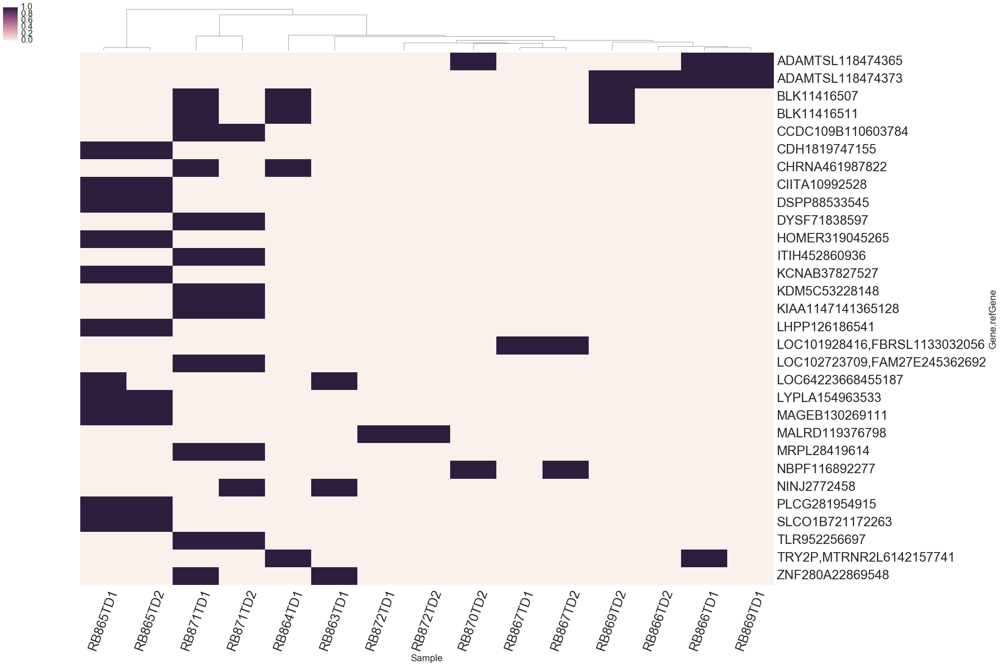

In [31]:
total_common_gene_split_pivot_fillna = total_common_gene_split_pivot_t_t.fillna(0)
sns.set(font_scale=2)
cg = sns.clustermap(total_common_gene_split_pivot_fillna,figsize=(32, 24),metric="matching",row_cluster=False)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0,fontsize = 30)
plt.setp(cg.ax_heatmap.xaxis.get_majorticklabels(), rotation=70,fontsize = 30)
plt.show()